In [1]:
import numpy as np
import loompy
import numpy as np
import pandas as pd
import scanpy as sc
import scipy as sp
import matplotlib.pyplot as plt
import glob
import bbknn
import seaborn as sns
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline
from pandas.core.index import RangeIndex

import scvelo as scv
scv.logging.print_version()

C:\Users\ryand\miniconda3\envs\scrna\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  


Running scvelo 0.2.1 (python 3.7.6) on 2020-11-02 13:19.
 Your version: 		 0.2.1 
 Latest version: 	 0.2.2


In [2]:
sc.settings.set_figure_params(dpi=140)

In [3]:
adata = sc.read_loom(
    r'D:\Paper Writing Driskell Lab\ExpDerm2020\NewLoomFiles\D14_SWpos_aligned_to_tdT_possorted_genome_bam_6PEPL.loom',
    sparse=True, cleanup=False, X_name='spliced',
obs_names='CellID',
var_names='Gene', dtype='float32')  

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [4]:
adata.var_names_make_unique()  # this is unnecessary if using 'gene_ids'

#adata2.var_names_make_unique()  # this is unnecessary if using 'gene_ids'

#adata3.var_names_make_unique()  # this is unnecessary if using 'gene_ids'

In [5]:
#adata = adata1.concatenate(adata2, batch_key='Time', batch_categories=['SW14dpwneg','SW14dpwPos'])

In [6]:
adata

AnnData object with n_obs × n_vars = 4051 × 31045
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

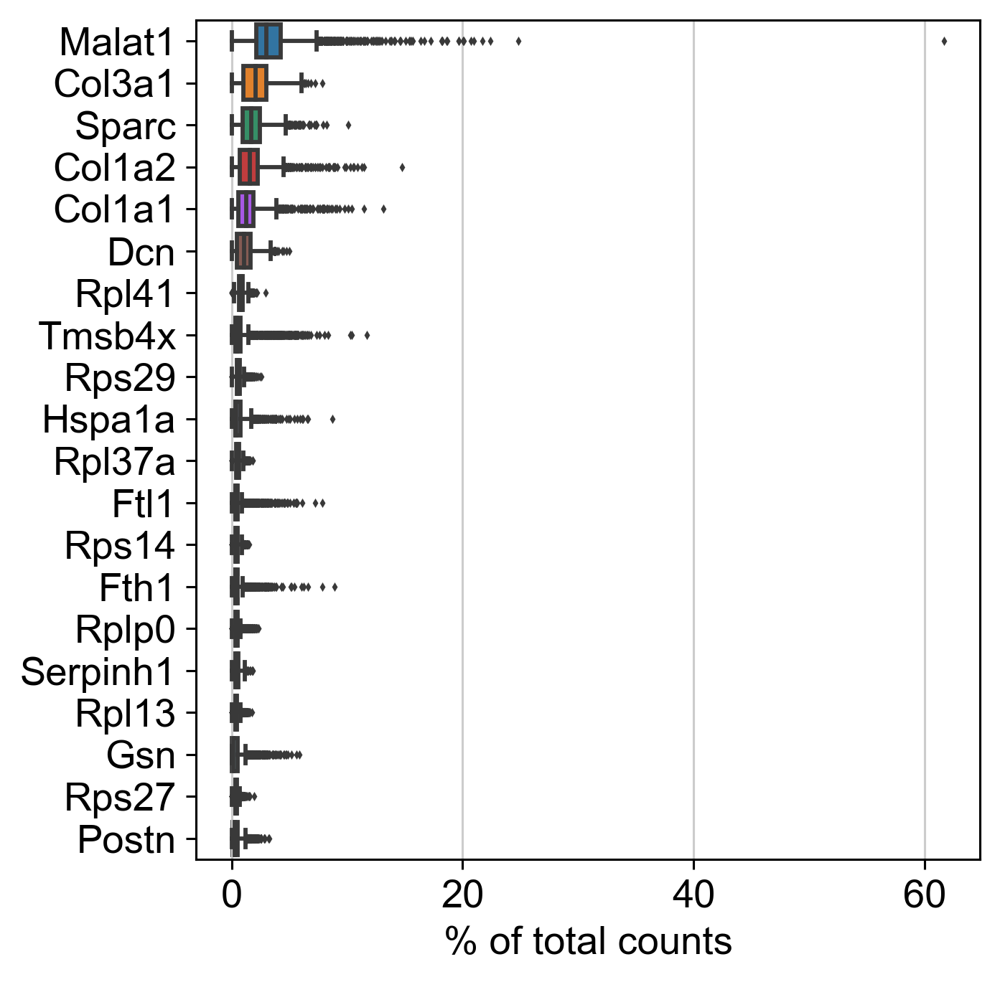

In [7]:
sc.pl.highest_expr_genes(adata, n_top=20)

In [8]:
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=1)

In [9]:
mito_genes = adata.var_names.str.startswith('mt-')
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
adata.obs['percent_mito'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1

... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


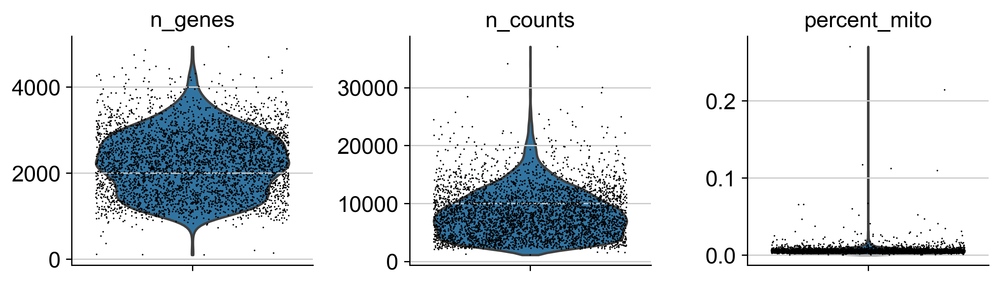

In [10]:
sc.pl.violin(adata, ['n_genes', 'n_counts','percent_mito'],
             jitter=0.4, multi_panel=True)

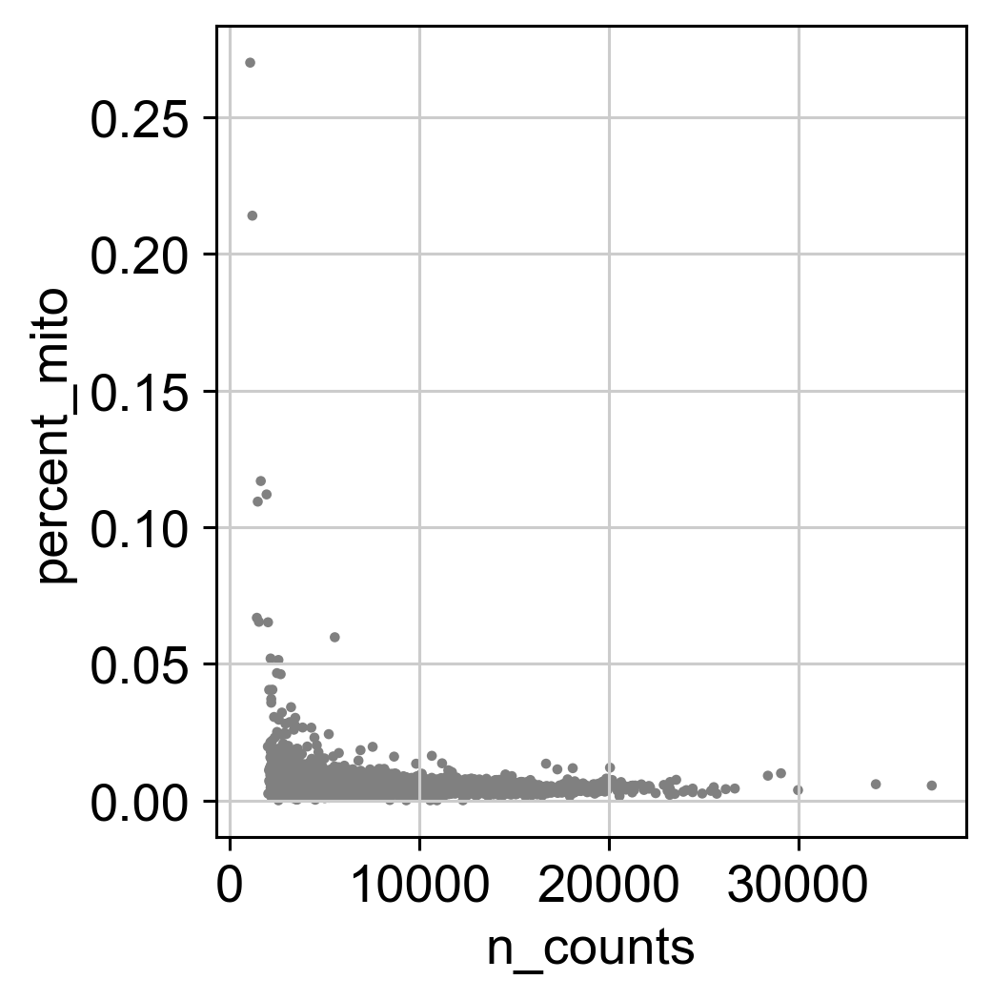

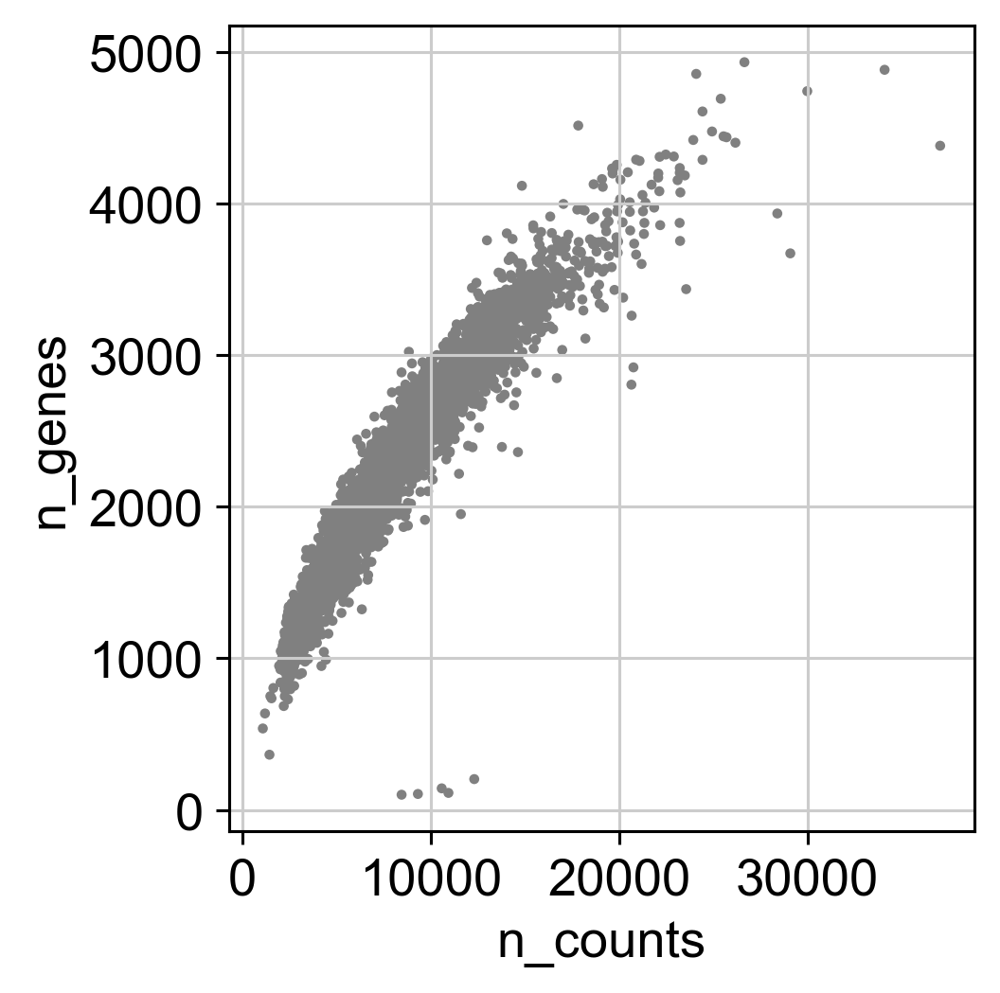

In [11]:
sc.pl.scatter(adata, x='n_counts', y='percent_mito')
sc.pl.scatter(adata, x='n_counts', y='n_genes')

In [12]:
adata

AnnData object with n_obs × n_vars = 4044 × 19101
    obs: 'n_genes', 'percent_mito', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [13]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

In [14]:
sc.pp.log1p(adata)

In [15]:
adata.raw = adata

In [16]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

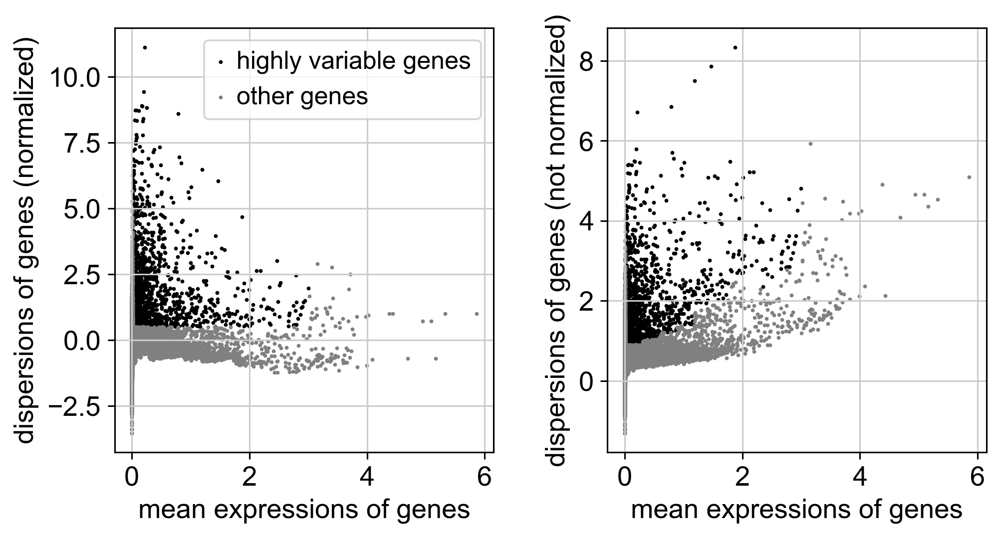

In [17]:
sc.pl.highly_variable_genes(adata)

In [18]:
adata = adata[:, adata.var['highly_variable']]

In [19]:
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'])

In [20]:
sc.pp.scale(adata, max_value=10)

In [21]:
sc.tl.pca(adata, svd_solver='arpack')

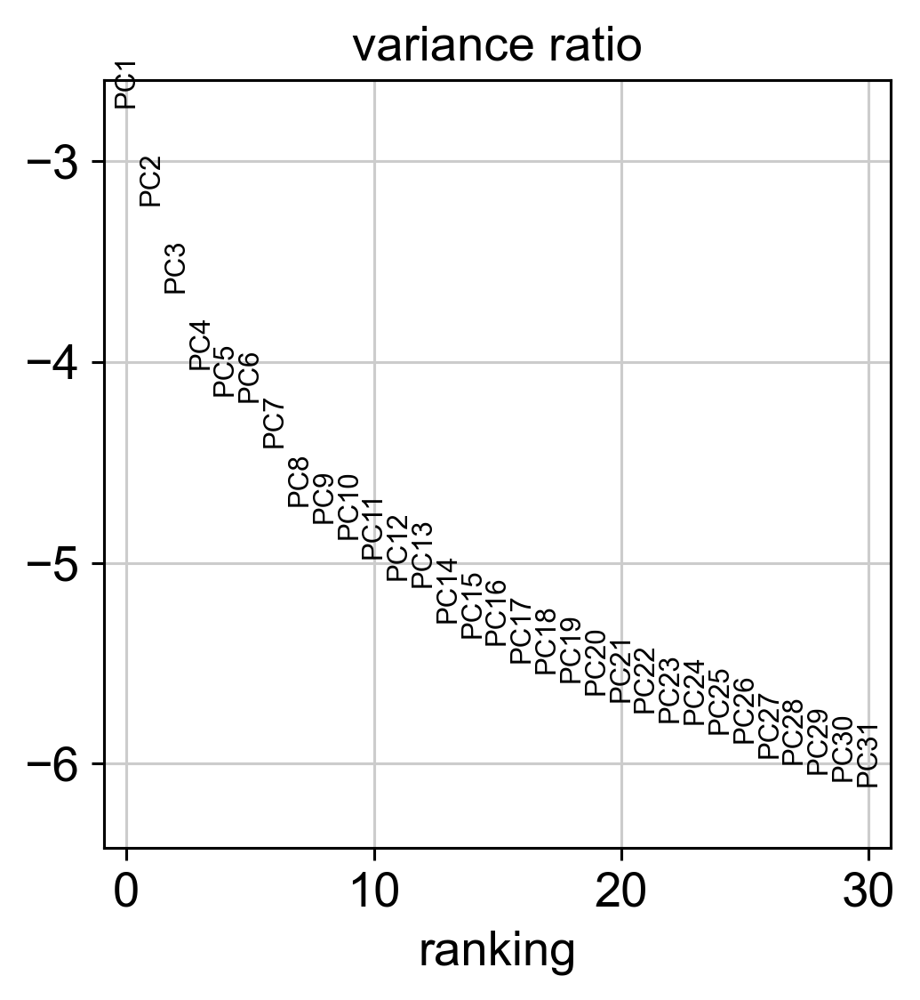

In [23]:
sc.pl.pca_variance_ratio(adata, log=True)

In [24]:
adata

AnnData object with n_obs × n_vars = 4044 × 2009
    obs: 'n_genes', 'percent_mito', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [25]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

In [26]:
sc.tl.umap(adata)

In [27]:
marker_genes = ['Krt14', 'Krt15','Krt17','Krt79','Tyrobp','Lyz2','Ptprc','Dct',
                'Vim','Pdgfra','Twist2','En1','Inhba','Plp1','Mbp','Rgs5','Acta2','Pecam1','Dpt','Corin','Hey1',
                'Cd200','Rspo3'
                 ]

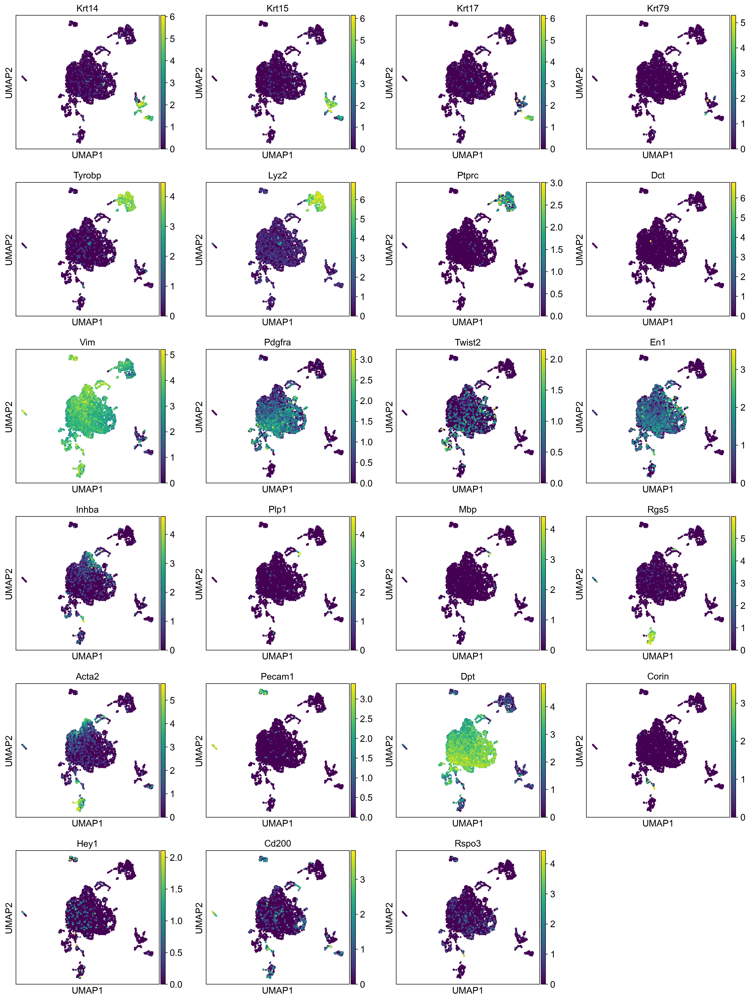

In [28]:
sc.pl.umap(adata, color=marker_genes, use_raw=True)

In [29]:
sc.tl.leiden(adata, resolution=0.3)

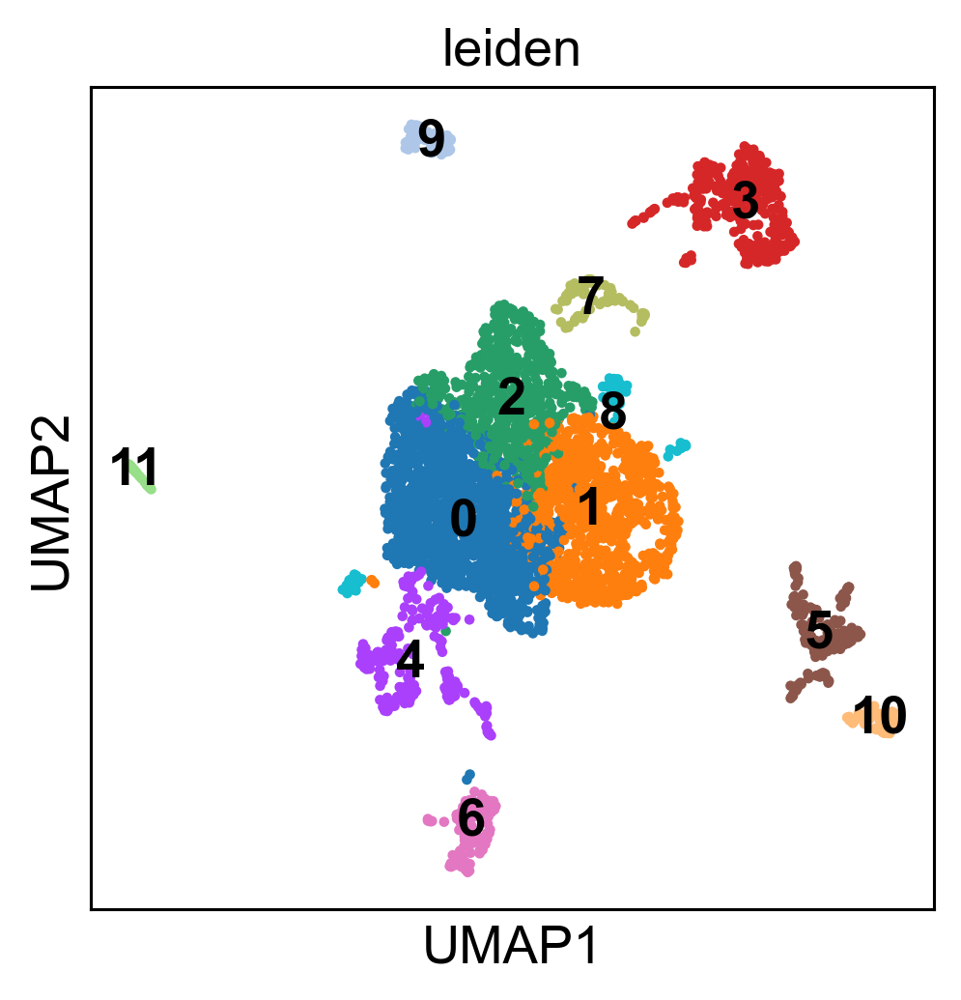

In [30]:
sc.pl.umap(adata, color=['leiden'], legend_loc='on data', wspace=0.35)

In [31]:
#####SUBSETTING THE DATA#####

In [32]:
adata_subset = adata[adata.obs['leiden'].isin(
    ['0','1','2','4','7','8'])]

In [33]:
adata_subset

View of AnnData object with n_obs × n_vars = 3279 × 2009
    obs: 'n_genes', 'percent_mito', 'n_counts', 'leiden'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

In [34]:
sc.tl.pca(adata_subset, svd_solver='arpack')

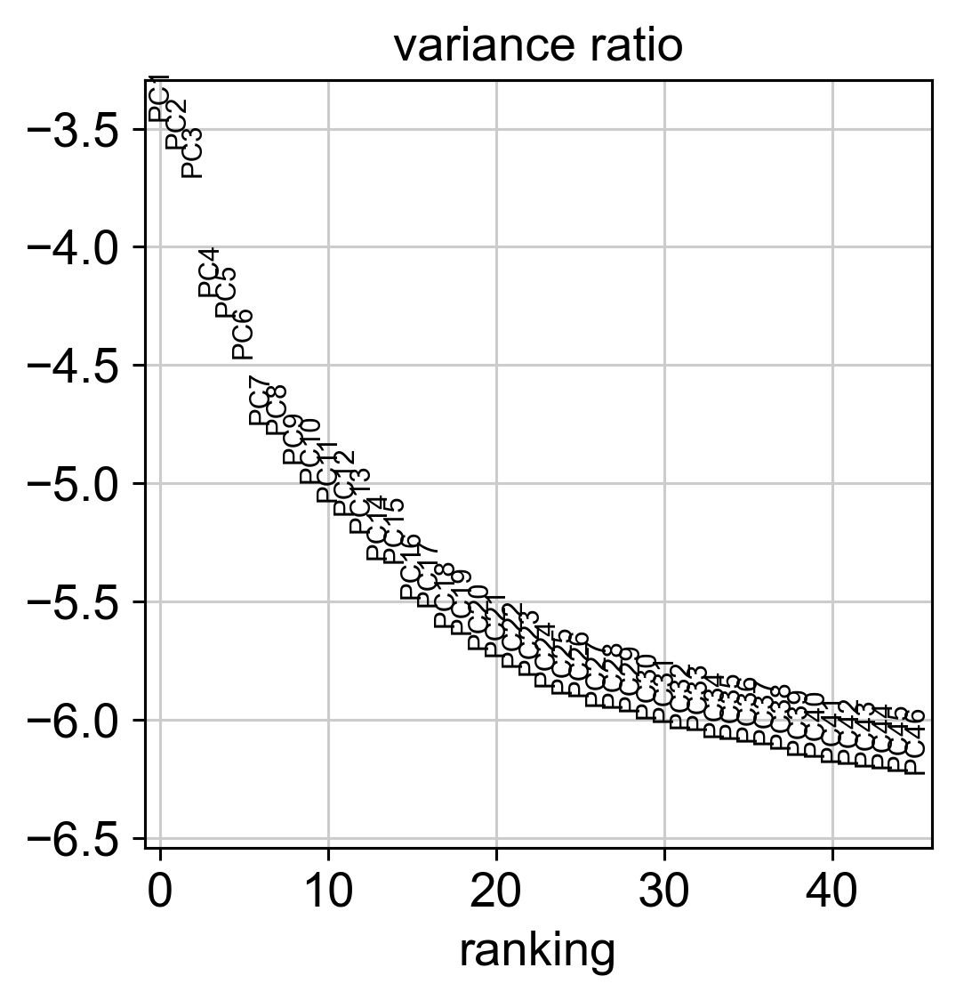

In [36]:
sc.pl.pca_variance_ratio(adata_subset, n_pcs=45, log=True)

In [37]:
#bdata = bbknn.bbknn(adata_subset,batch_key='Time',copy=True)

In [38]:
#sc.tl.umap(adata_subset)

In [39]:
sc.pp.neighbors(adata_subset)

In [40]:
sc.tl.umap(adata_subset)

In [41]:
sc.tl.leiden(adata_subset)

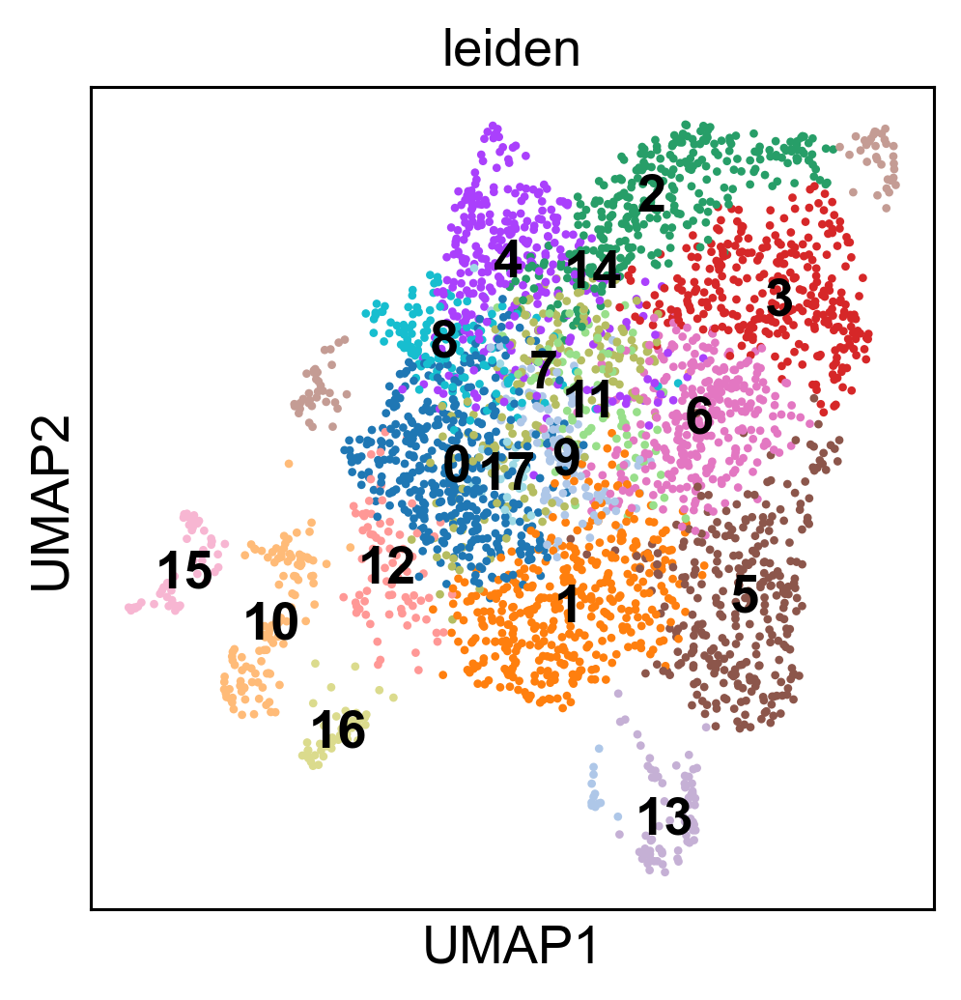

In [49]:
sc.pl.umap(adata_subset, color=['leiden'], legend_loc='on data', wspace=0.5, size=20)

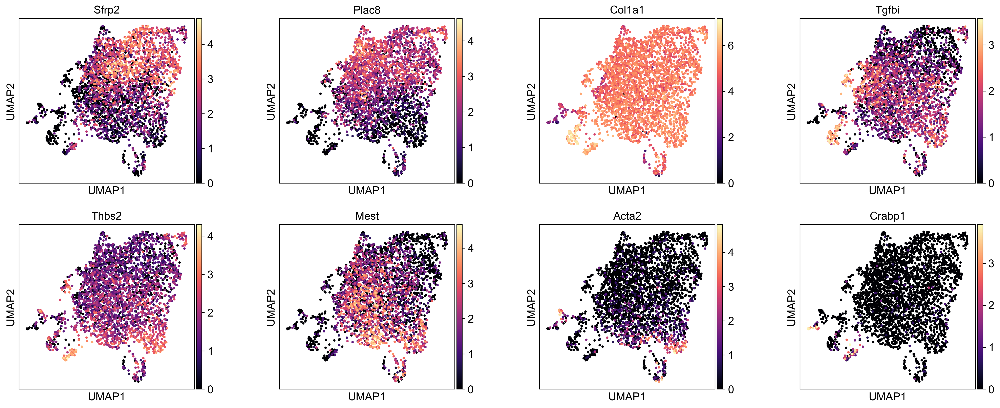

In [51]:
sc.pl.umap(adata_subset, color=['Sfrp2','Plac8','Col1a1','Tgfbi','Thbs2',
                               'Mest','Acta2','Crabp1'], 
           color_map= 'magma',
           wspace=0.35)

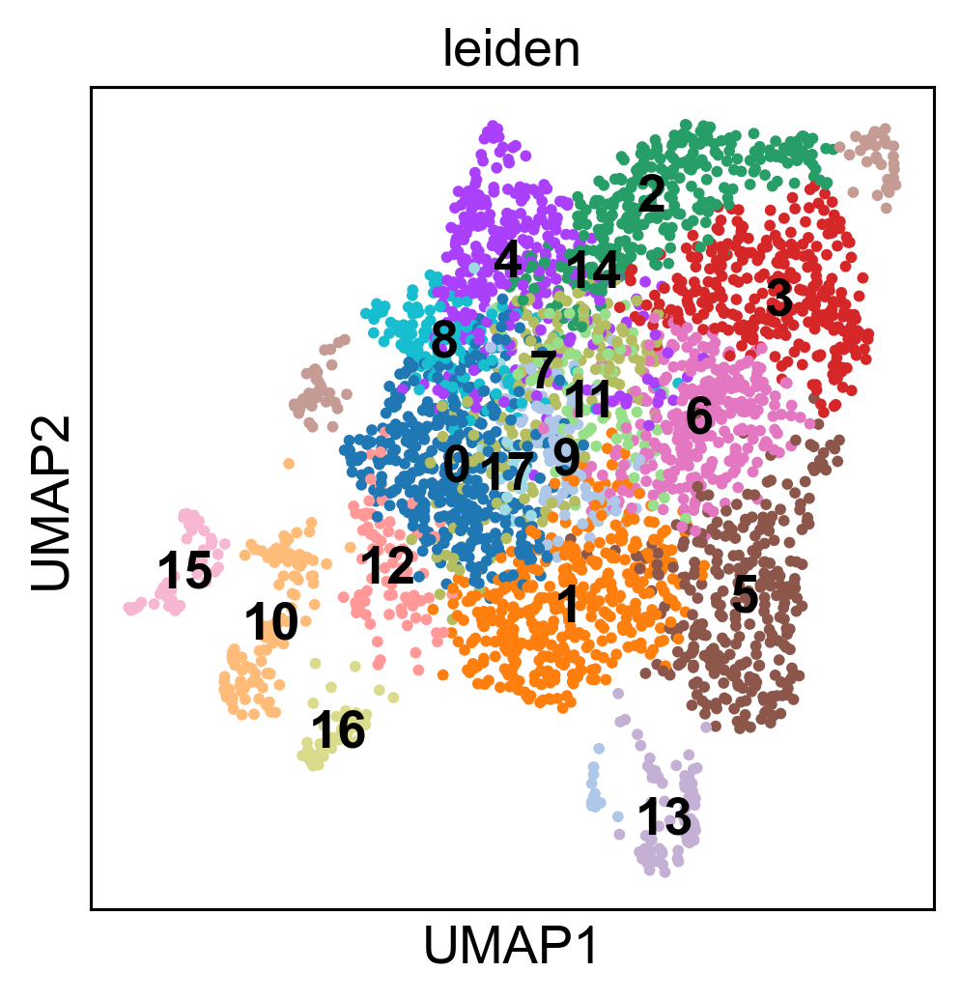

In [52]:
sc.pl.umap(adata_subset, color=['leiden'], legend_loc='on data', wspace=0.35)

In [53]:
###COLORING THE TIME PLOT####

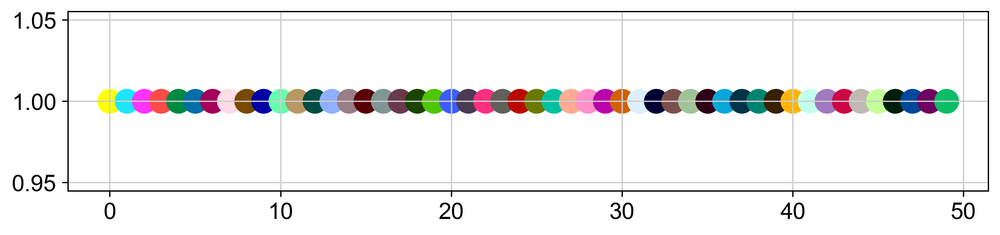

In [54]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as pl
from matplotlib import rcParams
import scanpy as sc
pl.figure(figsize=(10, 2))
for i in range(50):
    pl.scatter(i, 1, c=sc.pl.palettes.godsnot_102[i], s=200)
pl.show()

In [55]:
default_colors = np.array(sc.pl.palettes.godsnot_102)
new_colors = np.array(adata_subset.uns['leiden_colors'])

In [56]:
new_colors[[0]] = default_colors[[8]]  # 'LWC14dpwPNeg'
new_colors[[1]] = default_colors[[40]]  #  'LWC14dpwPos'
new_colors[[2]] = default_colors[[30]]  #  'LWC14dpwPos'
new_colors[[3]] = default_colors[[30]]  #  'LWC14dpwPos'
new_colors[[4]] = default_colors[[30]]  #  'LWC14dpwPos'
new_colors[[5]] = default_colors[[40]]  #  'LWC14dpwPos'
new_colors[[6]] = default_colors[[30]]  #  'LWC14dpwPos'
new_colors[[7]] = default_colors[[30]]  #  'LWC14dpwPos'
new_colors[[8]] = default_colors[[30]]  #  'LWC14dpwPos'
new_colors[[9]] = default_colors[[30]]  #  'LWC14dpwPos'
new_colors[[10]] = default_colors[[6]]  #  'LWC14dpwPos'
new_colors[[11]] = default_colors[[30]]  #  'LWC14dpwPos'
new_colors[[12]] = default_colors[[8]]  #  'LWC14dpwPos'
new_colors[[13]] = default_colors[[40]]  #  'LWC14dpwPos'
new_colors[[14]] = default_colors[[30]]  #  'LWC14dpwPos'
new_colors[[15]] = default_colors[[47]]  #  'LWC14dpwPos'
new_colors[[16]] = default_colors[[47]]  #  'LWC14dpwPos'
new_colors[[17]] = default_colors[[8]]  #  'LWC14dpwPos'


In [57]:
adata_subset.uns['leiden_colors'] = new_colors

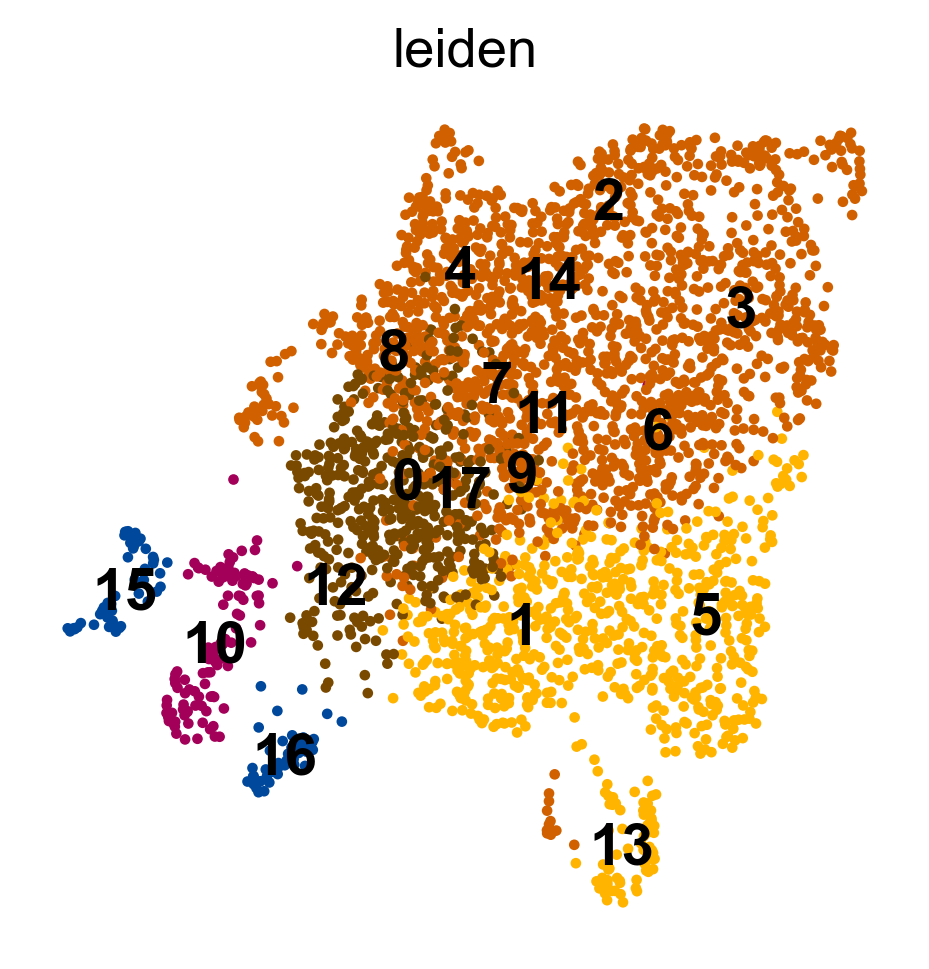

In [58]:
sc.pl.umap(adata_subset, color='leiden', legend_loc='on data', legend_fontsize='15.0',
           frameon=False, size=30)

In [59]:
###Velocity analysis@@@##$#

In [60]:
import scvelo as scv
scv.logging.print_version()

Running scvelo 0.2.1 (python 3.7.6) on 2020-11-02 13:20.
 Your version: 		 0.2.1 
 Latest version: 	 0.2.2


In [61]:
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization

In [62]:
adata_subset

AnnData object with n_obs × n_vars = 3279 × 2009
    obs: 'n_genes', 'percent_mito', 'n_counts', 'leiden'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

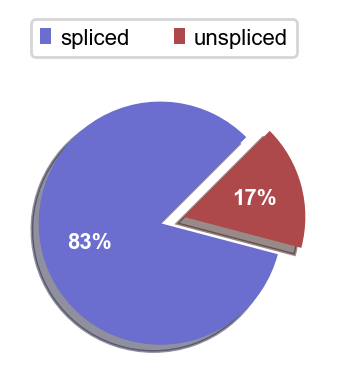

In [63]:
scv.pl.proportions(adata_subset)

In [64]:
scv.pp.filter_and_normalize(adata_subset)
scv.pp.moments(adata_subset)

Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of spliced/unspliced abundances (adata.layers)


In [65]:
scv.tl.velocity(adata_subset)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [66]:
scv.tl.velocity_graph(adata_subset)

computing velocity graph
    finished (0:00:07) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


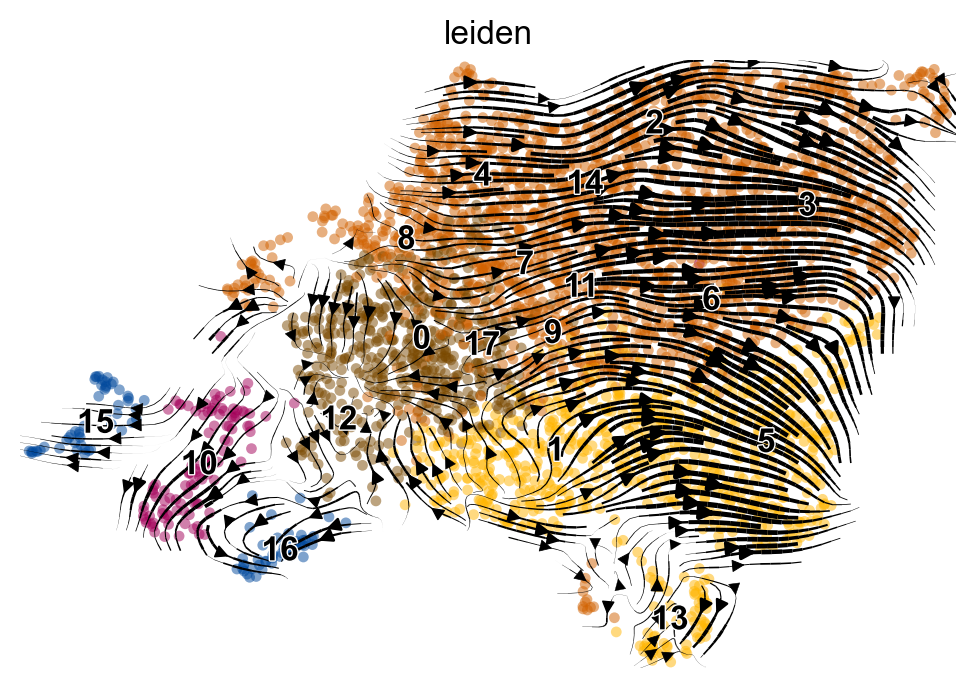

In [67]:
scv.pl.velocity_embedding_stream(adata_subset, basis='umap', color='leiden',
                                legend_loc='on data', alpha=0.5, size=60,
                                density=1.5)

In [70]:
scv.tl.rank_velocity_genes(adata_subset, groupby='leiden', min_corr=.3, n_genes=10000)

df = scv.DataFrame(adata_subset.uns['rank_velocity_genes']['names'])
df.head(1000)

ranking velocity genes
    finished (0:00:01) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,Col6a3,Bpgm,Stmn4,Nfkb1,Mt1,Cav1,Ifi205,Hspe1,Apoe,Col15a1,Cadm3,Atf3,Slit2,Sbspon,Acss3,Crispld2,Mylk,Col6a5
1,Col6a6,Ltbp2,Limch1,Slc3a2,Slc10a6,Nrp2,Nfkb1,Ncam1,Hspe1,Sorbs2,Lsamp,Ptger3,Eln,Ano1,Thsd7a,Ctsc,Ptger3,Tgfbi
2,Eln,Pdlim3,Hpgd,Sema3e,Frmd4b,Il1rl1,Slc3a2,Anxa3,Chrdl1,Tenm2,Cdh13,Lrrc15,Tnfrsf19,Ptpre,Cadm3,Slc6a6,Tnfrsf11b,Smoc2
3,Pde3a,Clu,Sema3d,Ugdh,Icam1,Tpm1,Lsmem1,Itgbl1,Icam1,Dpp4,Thsd7a,Sfrp4,Cdh13,Pappa,Bmp7,Wif1,Cdh6,Mt1
4,Hspe1,Cxcl2,Rcan2,Ngf,Apoe,Grem2,Ugdh,Abcc9,Ism1,Fosb,Robo2,Spc25,Spc25,Samd5,Tle4,Map2,Map2,Plac8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
294,Lgals3,Frmd4b,Nov,Sfrp4,Ngf,Grem1,Svep1,Gda,Tgfbi,Slc3a2,Has2,Adamts5,Slc3a2,Meox2,Zim1,Col4a1,Stmn4,Itgbl1
295,Nfkb1,Sema3e,Slit2,Col6a3,Igf2bp2,Spon1,Col6a3,Gm26771,Ccl11,Mest,Tgfb2,Cdc42ep3,Fgfr2,Dusp10,Slc10a6,Bpgm,Tgfb2,Sept4
296,Sema3e,Ism1,Lsmem1,Pde3a,Dgkb,Ncam1,Sfrp4,Crispld2,Lsamp,Esr1,Rnd3,Dkk2,Col8a1,Rnd3,Tgfb2,Ndrg1,Rcan2,Gm26522
297,Fgfr2,Apoe,Adamts5,Efemp1,Ifi205,C1qtnf3,Pde3a,Grem2,Ugdh,Ppp1r15a,Mt1,Sult5a1,Nfkb1,Ism1,Atf3,Trf,Wisp2,Eng
